## Installation of OpenPose

### # Installation of OpenPose and required python libraries

In [2]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = "OpenPose"
if not exists(project_name):
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`

Selecting previously unselected package libgflags2.2.
(Reading database ... 129499 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.2-1build1_amd64.deb ...
Unpacking libgflags2.2 (2.2.2-1build1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.2-1build1_amd64.deb ...
Unpacking libgflags-dev (2.2.2-1build1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.4.0-1build1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.4.0-1build1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.4.0-1build1_amd64.deb ...
Unpacking libgoogle-glog-dev (0.4.0-1build1) ...
Selecting previously unselected package libleveldb1d:amd64.
Preparing to unpack .../04-libleveldb1d_1.22-3ubuntu2_amd64.deb ...
Unpacking libleveldb1d:amd64 (1.22-3ubuntu2) ...
Selecting previously unselected package libleveldb-dev

### # Running OpenPose on input video.

In [3]:
!rm -r openpose/output
!mkdir openpose/output
!rm openpose.avi
!cd openpose && ./build/examples/openpose/openpose.bin --video /content/tennis.mp4 --write_json ./output/ --display 0 --write_video ../openpose.avi --model_pose "BODY_25"
# convert the result into MP4
!ffmpeg -y -loglevel info -i openpose.avi output.mp4

rm: cannot remove 'openpose/output': No such file or directory
rm: cannot remove 'openpose.avi': No such file or directory
Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
OpenPose demo successfully finished. Total time: 532.935351 seconds.
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --

### # Importing required modules

In [4]:
import os
import cv2
import math
import json
import numpy as np
from google.colab.patches import cv2_imshow

### # Determining court coordinates

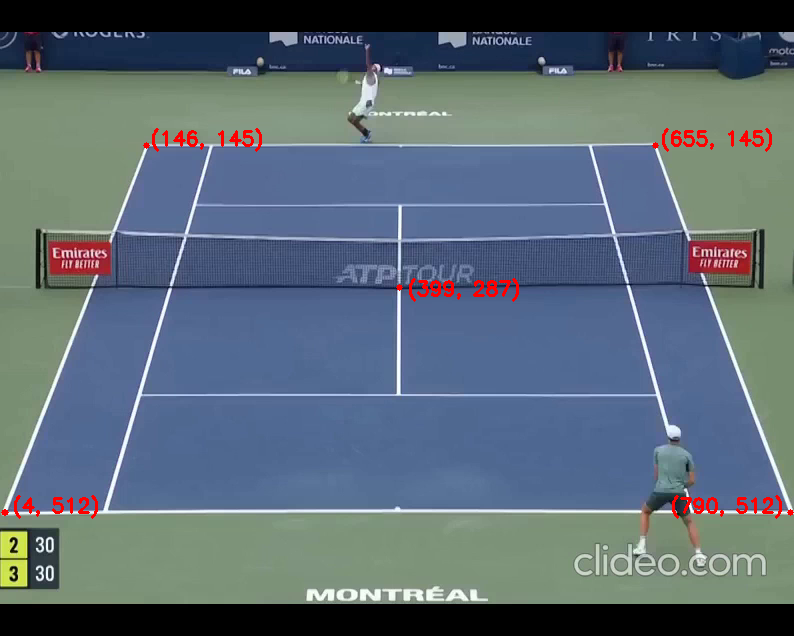

In [5]:
cap = cv2.VideoCapture('tennis.mp4')
ret, frame = cap.read()
frame1 = frame.copy()
font = cv2.FONT_HERSHEY_SIMPLEX
# top-left point
cv2.rectangle(frame,(146, 145),(146, 145),(0,0,255),6)
cv2.putText(frame,'(146, 145)', (150, 145), font, 0.65, (0, 0, 255), 2, cv2.LINE_4)
# top-right point
cv2.rectangle(frame,(655, 145),(655, 145),(0,0,255),6)
cv2.putText(frame,'(655, 145)', (660, 145), font, 0.65, (0, 0, 255), 2, cv2.LINE_4)
# center point - origin
cv2.rectangle(frame,(399, 287),(399, 287),(0,0,255),6)
cv2.putText(frame,'(399, 287)', (407, 295), font, 0.65, (0, 0, 255), 2, cv2.LINE_4)
# bottom left point
cv2.rectangle(frame,(4, 512),(5, 512),(0,0,255),6)
cv2.putText(frame,'(4, 512)', (12, 512), font, 0.65, (0, 0, 255), 2, cv2.LINE_4)
# bottom right point
cv2.rectangle(frame,(790, 512),(790, 512),(0,0,255),6)
cv2.putText(frame,'(790, 512)', (670, 512), font, 0.65, (0, 0, 255), 2, cv2.LINE_4)
cv2_imshow(frame)
  
cap.release()
cv2.destroyAllWindows()

In [6]:
# Obtaining left verticle line from points
y = [33, 602]
for y_ in y:
  x = (y_ - 522.338028169014) / -2.584507042253521
  print(y_, "-->", x)

33 --> 189.3351498637602
602 --> -30.82288828337877


In [7]:
# Obtaining right verticle line from points
y = [33, 602]
for y_ in y:
  x = (y_ + 1635.6296296296296) / 2.7185185185185183
  print(y_, "-->", x)

33 --> 613.8010899182561
602 --> 823.1062670299727


In [8]:
# Computing Homography
op1 = [189.33, 33]
op2 = [613.80, 33]
op3 = [-30.82, 602]
op4 = [823.11, 602]

exp1 = [0, 0]
exp2 = [400, 0]
exp3 = [0, 1320]
exp4 = [400, 1320]

rect = np.array([op1, op2, op3, op4], np.float32)
dst = np.array([exp1, exp2, exp3, exp4], np.float32)

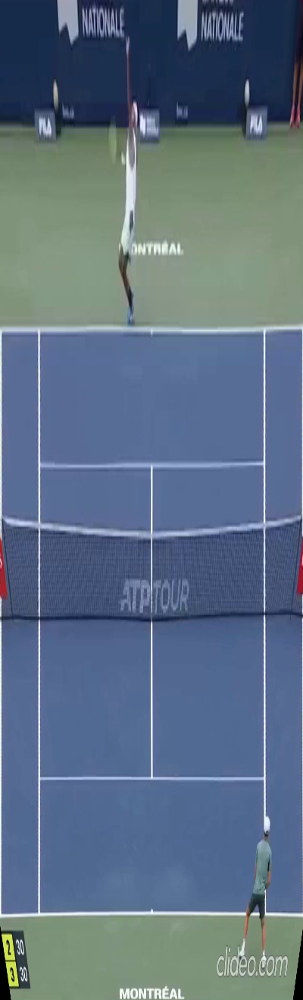

In [9]:
# Performing perspective transformation
mat = cv2.getPerspectiveTransform(rect, dst)
warped = cv2.warpPerspective(frame1, mat, (400, 1320))
cv2_imshow(warped)

In [10]:
# function to get coordinates post inverse perspective transformation
def get_point(mat, shape, x, y):
  center = np.zeros(shape, dtype=np.uint8)
  cv2.rectangle(center, (x, y),(x, y),(0,0,255),6)
  warped = cv2.warpPerspective(center, mat, (400, 1320))
  ind = np.where(warped == 255)
  if len(ind[0]) == 0:
    return (-1, -1) 
  x = int(np.mean(ind[1]))
  y = int(np.mean(ind[0])) 
  return (x, y)

In [11]:
#determining center point of tennis court
center = get_point(mat, frame.shape, 399, 287)
center

(200, 817)

In [12]:
#determining extreme point of tennis court
edge11 = get_point(mat, frame.shape, 399, 145)
edge22 = get_point(mat, frame.shape, 399, 512)

In [13]:
print(edge11)
print(edge22)

(199, 436)
(201, 1207)


In [14]:
# reading output json file from openpose
out_files = []
for root_dir, cur_dir, files in os.walk("/content/openpose/output"):
    out_files.extend(files)
out_files = sorted(out_files)

In [15]:
#determining coordinates of players in proposed coordinate system and service angle of the players
positions = []
angles = []
cnt_frame_both_players_detected = 0
cnt_frame_both_players_not_detected = 0

cnt_frame_req_keypoints_detected = 0
cnt_frame_req_keypoints_not_detected = 0

for file_path in out_files:
  file = open("/content/openpose/output/" + file_path)
  res = json.load(file)
  if len(res['people']) > 1:
    cnt_frame_both_players_detected += 1
    key_points_p1 = res['people'][0]['pose_keypoints_2d']
    x1p1, y1p1 = key_points_p1[60], key_points_p1[61]
    x2p1, y2p1 = key_points_p1[69], key_points_p1[70]  
    xp1, yp1 = round((x1p1 + x2p1) / 2, 2), round((y1p1 + y2p1) / 2, 2)
    xp1, yp1 = get_point(mat, frame.shape, int(xp1), int(yp1))

    key_points_p2 = res['people'][1]['pose_keypoints_2d']
    x1p2, y1p2 = key_points_p2[60], key_points_p2[61]
    x2p2, y2p2 = key_points_p2[69], key_points_p2[70]  
    xp2, yp2 = round((x1p2 + x2p2) / 2, 2), round((y1p2 + y2p2) / 2, 2)
    xp2, yp2 = get_point(mat, frame.shape, int(xp2), int(yp2))

    if xp1 == -1 or xp2 == -1:
      cnt_frame_req_keypoints_not_detected += 1
      continue

    key_points_p1 = res['people'][0]['pose_keypoints_2d']
    shldr = key_points_p1[3], key_points_p1[4]
    elbw = key_points_p1[6], key_points_p1[7]  
    wrst = key_points_p1[9], key_points_p1[10]
    head = round((key_points_p1[42] + key_points_p1[45])/2, 2), round((key_points_p1[43] + key_points_p1[46])/2, 2)
    p21 = math.sqrt((shldr[0] - elbw[0])**2 + (shldr[1] - elbw[1])**2)
    p23 = math.sqrt((wrst[0] - elbw[0])**2 + (wrst[1] - elbw[1])**2)
    p13 = math.sqrt((shldr[0] - wrst[0])**2 + (shldr[1] - wrst[1])**2)
    if not p21 or not p23 or not p13:
      cnt_frame_req_keypoints_not_detected += 1
      continue
    
    angle = math.degrees(math.acos((p21**2 + p23**2 - p13**2) / (2 * p21 * p23)))
    if yp1 < center[1] and head[1] - wrst[1] > 10 and yp1 < edge11[1] and angle > 120:
      a1 = angle
    elif yp1 > center[1] and head[1] - wrst[1] > 10 and yp1 > edge22[1] and angle > 120:
      a1 = angle
    else:
      a1 = -1

    key_points_p2 = res['people'][1]['pose_keypoints_2d']
    shldr = key_points_p2[3], key_points_p2[4]
    elbw = key_points_p2[6], key_points_p2[7]
    wrst = key_points_p2[9], key_points_p2[10]
    head = round((key_points_p2[42] + key_points_p2[45])/2, 2), round((key_points_p2[43] + key_points_p2[46])/2, 2)
    p21 = math.sqrt((shldr[0] - elbw[0])**2 + (shldr[1] - elbw[1])**2)
    p23 = math.sqrt((wrst[0] - elbw[0])**2 + (wrst[1] - elbw[1])**2)
    p13 = math.sqrt((shldr[0] - wrst[0])**2 + (shldr[1] - wrst[1])**2)
    if not p21 or not p23 or not p13:
      cnt_frame_req_keypoints_not_detected += 1
      continue

    angle = math.degrees(math.acos((p21**2 + p23**2 - p13**2) / (2 * p21 * p23)))
    if yp2 < center[1] and head[1] - wrst[1] > 10 and yp2 < edge11[1] and angle > 120:
      a2 = angle
    elif yp2 > center[1] and head[1] - wrst[1] > 10 and yp2 > edge22[1] and angle > 120:
      a2 = angle
    else:
      a2 = -1

    angles.append([round(a1, 2), round(a2, 2)])

    positions.append([(xp1, yp1), (xp2, yp2)])
    cnt_frame_req_keypoints_detected += 1
  else:
    cnt_frame_both_players_not_detected += 1


In [22]:
print("Number of frame in both players detected.", cnt_frame_both_players_detected)
print("Number of frame in both players not detected.", cnt_frame_both_players_not_detected)
print("Number of frame in all required keypoints detected.", cnt_frame_req_keypoints_detected)
print("Number of frame in all required keypoints not detected.", cnt_frame_req_keypoints_not_detected)

Number of frame in both players detected. 3199
Number of frame in both players not detected. 32
Number of frame in all required keypoints detected. 2971
Number of frame in all required keypoints not detected. 228


### # Output

In [17]:
#Writing coordinates into result file in required format
ind = 2280

fout = open('res_positions.txt', 'w')

i = 1
for players in positions:
  if i >= ind:
    blue_ind = 0 if players[0][1] > center[1] else 1
    blue = players[blue_ind]
    green = players[1-blue_ind]
  else:
    blue_ind = 0 if players[0][1] <= center[1] else 1
    blue = players[blue_ind]
    green = players[1-blue_ind]

  blue_x, blue_y = (blue[0] - center[0]), (center[1] - blue[1])
  green_x, green_y = (green[0] - center[0]), (center[1] - green[1])

  fout.write('start-frame-'+str(i)+'\n')  
  fout.write('\t blue ' + str(1) + ' ' + str(blue_x) + ' ' + str(blue_y) + '\n')
  fout.write('\t green ' + str(1) + ' ' + str(green_x) + ' ' + str(green_y) + '\n')
  fout.write('end-frame-'+str(i)+'\n\n')
  i += 1

fout.close()

In [18]:
file = open('res_positions.txt')
print(file.read())
file.close()

start-frame-1
	 blue 1 -29 424
	 green 1 134 -441
end-frame-1

start-frame-2
	 blue 1 -30 425
	 green 1 133 -439
end-frame-2

start-frame-3
	 blue 1 -30 425
	 green 1 133 -438
end-frame-3

start-frame-4
	 blue 1 -29 418
	 green 1 133 -436
end-frame-4

start-frame-5
	 blue 1 -29 424
	 green 1 132 -435
end-frame-5

start-frame-6
	 blue 1 -29 424
	 green 1 132 -435
end-frame-6

start-frame-7
	 blue 1 -30 425
	 green 1 132 -435
end-frame-7

start-frame-8
	 blue 1 -30 432
	 green 1 131 -435
end-frame-8

start-frame-9
	 blue 1 -30 428
	 green 1 131 -434
end-frame-9

start-frame-10
	 blue 1 -30 431
	 green 1 132 -431
end-frame-10

start-frame-11
	 blue 1 -33 435
	 green 1 132 -426
end-frame-11

start-frame-12
	 blue 1 -34 424
	 green 1 130 -419
end-frame-12

start-frame-13
	 blue 1 -34 428
	 green 1 128 -418
end-frame-13

start-frame-14
	 blue 1 -195 672
	 green 1 123 -413
end-frame-14

start-frame-15
	 blue 1 -27 401
	 green 1 116 -406
end-frame-15

start-frame-16
	 blue 1 -193 655
	 green 1

In [19]:
#writing angles in output file in desired format
ind = 2280

fout = open('res_angles.txt', 'w')

i = 1
for players, players_angles in zip(positions, angles):
  if i >= ind:
    blue_ind = 0 if players[0][1] > center[1] else 1
    blue = players_angles[blue_ind] if players_angles[blue_ind] != -1 else "N/A"
    green = players_angles[1-blue_ind] if players_angles[1-blue_ind] != -1 else "N/A"
  else:
    blue_ind = 0 if players[0][1] <= center[1] else 1
    blue = players_angles[blue_ind] if players_angles[blue_ind] != -1 else "N/A"
    green = players_angles[1-blue_ind] if players_angles[1-blue_ind] != -1 else "N/A"

  fout.write('start-frame-'+str(i)+'\n')  
  fout.write('\t blue ' + str(1) + ' ' + str(blue) + '\n')
  fout.write('\t green ' + str(1) + ' ' + str(green) + '\n')
  fout.write('end-frame-'+str(i)+'\n\n')
  i += 1

fout.close()

In [20]:
file = open('res_angles.txt')
print(file.read())
file.close()

start-frame-1
	 blue 1 N/A
	 green 1 N/A
end-frame-1

start-frame-2
	 blue 1 128.66
	 green 1 N/A
end-frame-2

start-frame-3
	 blue 1 N/A
	 green 1 N/A
end-frame-3

start-frame-4
	 blue 1 169.61
	 green 1 N/A
end-frame-4

start-frame-5
	 blue 1 N/A
	 green 1 N/A
end-frame-5

start-frame-6
	 blue 1 N/A
	 green 1 N/A
end-frame-6

start-frame-7
	 blue 1 135.58
	 green 1 N/A
end-frame-7

start-frame-8
	 blue 1 N/A
	 green 1 N/A
end-frame-8

start-frame-9
	 blue 1 144.89
	 green 1 N/A
end-frame-9

start-frame-10
	 blue 1 134.8
	 green 1 N/A
end-frame-10

start-frame-11
	 blue 1 N/A
	 green 1 N/A
end-frame-11

start-frame-12
	 blue 1 132.66
	 green 1 N/A
end-frame-12

start-frame-13
	 blue 1 N/A
	 green 1 N/A
end-frame-13

start-frame-14
	 blue 1 N/A
	 green 1 N/A
end-frame-14

start-frame-15
	 blue 1 N/A
	 green 1 N/A
end-frame-15

start-frame-16
	 blue 1 N/A
	 green 1 N/A
end-frame-16

start-frame-17
	 blue 1 N/A
	 green 1 123.0
end-frame-17

start-frame-18
	 blue 1 133.83
	 green 1 151.98

In [21]:
 # Function to display output video
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)